<a href="https://colab.research.google.com/github/ElBuberino/Tensorflow_Final_Project_Beatbox/blob/main/ConvCNN_%26_Densenet_for_Beatbox_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Clone Github repository, where the data is stored
!git clone https://github.com/ElBuberino/Tensorflow_Final_Project_Beatbox
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Cloning into 'Tensorflow_Final_Project_Beatbox'...
remote: Enumerating objects: 338, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 338 (delta 6), reused 13 (delta 4), pack-reused 322
Receiving objects: 100% (338/338), 109.26 MiB | 24.28 MiB/s, done.
Resolving deltas: 100% (8/8), done.
Updating files: 100% (310/310), done.
Mounted at /content/drive


In [2]:
# Install keras_cv
!pip install keras_cv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 634.9/634.9 KB 22.4 MB/s eta 0:00:00


#Load data

In [4]:
# Import necessary packages
import pandas as pd
import os
import sys
import datetime
import pprint
import tqdm
from glob import glob
from IPython.display import Audio
from scipy.io import wavfile
import librosa
import librosa.display
import numpy as np
from numpy import newaxis
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.colors
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input, Dense, Dropout
from tensorflow.keras.models import Model 
import keras_cv

# Set path
PATH = "/content/Tensorflow_Final_Project_Beatbox/Personal"
# Set file ending
CSV = "*.csv"
WAV = "*.wav"

# Collect all csv files
all_csv_files = [file
                 for path, subdir, files in os.walk(PATH)
                 for file in glob(os.path.join(path, CSV))]

# Collect all wav files
all_wav_files = [file
                 for path, subdir, files in os.walk(PATH)
                 for file in glob(os.path.join(path, WAV))]

# Sort csv and wav files
all_csv_files = sorted(all_csv_files)
all_wav_files = sorted(all_wav_files)

#Preprocess data

In [10]:
# Create list for spectograms and labels
label_list = []
spec_list = []

for csv_file, wav_file in zip(all_csv_files, all_wav_files):
    # Create transient list for specrograms
    specs = []
    ## Create inputs ##
    # Load the audio as a waveform y, store the sampling rate as sr
    y, sr = librosa.load(wav_file)
    # Create mel spectrogram
    spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
    # Append loaded spectogram to specs
    specs.append(spectrogram)

    # Data Augmentation using pitch shift
    n_augmented = 3 
    for i in range(n_augmented):
      pitch_shift = librosa.effects.pitch_shift(y = y, sr = sr,n_steps=i*2)
      mel_spec = librosa.feature.melspectrogram(y=pitch_shift,sr=sr)
      # Append augmented spectogram to specs
      specs.append(mel_spec)

    ## Create labels ##
    # Read in csv file
    df = pd.read_csv(csv_file)
    # convert to numpy array
    df_arr = df.to_numpy()
    # Create array with onset times
    df_onsets = df_arr[:, 0]
    # Create array with labels ('hhc', 'hho', 'kd', 'sd')
    df_vals = df_arr[:, 1]
    # Create list with time indices of onset times
    onset_times = []
    # Store onset times in the shape of our spectrogram
    times = librosa.times_like(spectrogram)
    # Append each onset time into times_indexes list
    for i in df_onsets:
      onset_times.append(np.abs(times - i).argmin())

    # For each spectrogram, iterate through each onset time
    for spectrogram in specs:
      for i in range(len(onset_times)):

        # If it's the last onset, set start time to the current onset time and end time to the end of the spectrogram
        if onset_times[i] == onset_times[-1]:
          start = onset_times[i]
          end = spectrogram.shape[1]

        # For all other onsets, set start time to the current onset time and end time to the next onset time
        else:
          start = onset_times[i]
          end = onset_times[i+1]

        # Extract the corresponding sample from the current spectrogram     
        sample = spectrogram[:, start:end]

        # Fix the length of the sample to 31, if required
        sample = librosa.util.fix_length(data = sample, size = 31, axis=-1)

        # Normalize the values of the sample using min-max scaling
        min_value = np.min(sample)
        max_value = np.max(sample)
        # Normalize values to range [0,1]
        normalized_sample = np.apply_along_axis(lambda x: (x - min_value) / (max_value - min_value), 1, sample)
        
        # Append the normalized sample to the list of spectrogram samples
        spec_list.append(normalized_sample)

        # Generate the target label using one-hot-encoding, based on the csv-file
        if df_vals[i] == 'hhc':
            target = [1,0,0,0]

        elif df_vals[i] == 'hho':
            target = [0,1,0,0]

        elif df_vals[i] == 'kd':
            target = [0,0,1,0]

        elif df_vals[i] == 'sd':
            target = [0,0,0,1]
        
        # Append the target label to the list of labels
        label_list.append(target)

In [11]:
# Check length of spec and label list
print(len(spec_list))
print(len(label_list))

18932
18932


In [15]:
## Convert lists to datasets ##
spec_ds = tf.data.Dataset.from_tensor_slices(spec_list)
label_ds = tf.data.Dataset.from_tensor_slices(label_list)

# Zip together spec and label dataset
dataset = tf.data.Dataset.zip((spec_ds, label_ds))
# Mapping the dataset to add a dimension to the spectrogram and cast the target variable to float32
dataset = dataset.map(lambda spec, target: (tf.expand_dims(spec, axis=-1), tf.cast(target, tf.float32)))
# Shuffle
dataset_pre = dataset.shuffle(1000)
# Batch
dataset_pre = dataset_pre.batch(32)
# Prefetch
dataset_pre = dataset_pre.prefetch(20)

# Splitting the preprocessed dataset into a training set of 120 batches
train_dataset = dataset_pre.take(120)
#Creating a test set by skipping the first 120 batches in the preprocessed dataset
test_dataset = dataset_pre.skip(120)

In [18]:
# Check shape of training and test dataset
for (a,b),(c,d) in zip(train_dataset.take(1), test_dataset.take(1)):
    print("Training dataset:", a.shape, b.shape, "\nTest dataset:", c.shape, d.shape)

Training dataset: (32, 128, 31, 1) (32, 4) 
Test dataset: (32, 128, 31, 1) (32, 4)


#Visualize data

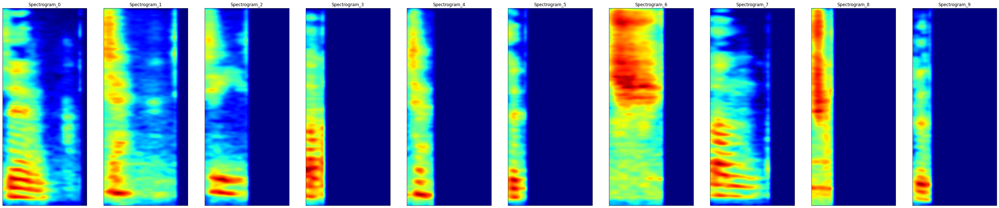

In [19]:
# set the number of plots to create
n = 10

# create a figure with n subplots
fig, axs = plt.subplots(1, n, figsize=(50,10))

# iterate through the first n examples in the train_dataset
for idx, (input, target) in enumerate(train_dataset):
    # exit the loop once n examples have been processed
    if idx == n:
        break

    # display spectrogram for the current example
    ax = axs[idx]
    # convert input to a decibel-scaled spectrogram and display it as an image
    im = ax.imshow(librosa.power_to_db(input[0,:,:,0], ref=np.max), aspect='auto', origin='lower', interpolation='bicubic', cmap='jet')
    # set the title of the subplot
    ax.set_title(f"Spectrogram_{idx}")
    # hide the x and y axis labels
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

# show the figure with all subplots
plt.show()

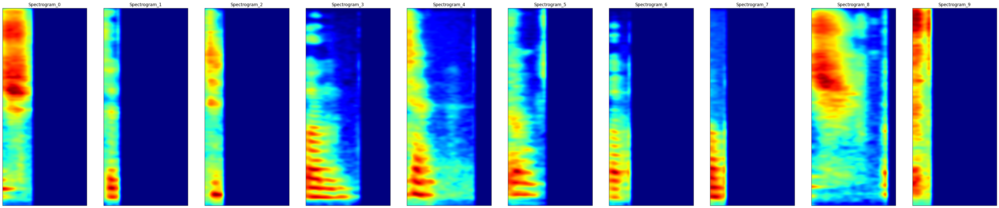

In [ ]:
n = 10
fig, axs = plt.subplots(1, n, figsize=(50,10))

for idx, (input, target) in enumerate(train_dataset):
    if idx == n:
        break

    # display spectrogram
    ax = axs[idx]
    im = ax.imshow(librosa.power_to_db(input[0,:,:,0], ref=np.max), aspect='auto', origin='lower', interpolation='bicubic', cmap='jet')
    ax.set_title(f"Spectrogram_{idx}")
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

# Model

### Basic Conv Model

In [29]:
# Model with no regularization, only the convolutional/dense layer & pooling
# 3 convolutional hidden layers + 1 fully connected hidden layer + ouput layer
class ConvModel(tf.keras.Model):
  
    def __init__(self):
        super().__init__()
        
        self.layer1 = tf.keras.layers.Conv2D(filters=32, kernel_size=5, padding='same', activation='relu')
        self.norm1 = tf.keras.layers.BatchNormalization()                    
        self.pool1 = tf.keras.layers.MaxPooling2D(pool_size=2, strides=2)
        self.dropout1 = tf.keras.layers.Dropout(0.2)

        self.layer2 = tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')
        self.norm2 = tf.keras.layers.BatchNormalization()   
        self.pool2 = tf.keras.layers.MaxPooling2D(pool_size=2, strides=2)
        self.dropout2 = tf.keras.layers.Dropout(0.2)

        self.layer3 = tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')
        self.norm3 = tf.keras.layers.BatchNormalization()   
        self.pool3 = tf.keras.layers.GlobalMaxPooling2D()
        self.dropout3 = tf.keras.layers.Dropout(0.2)

        self.layer4 = tf.keras.layers.Dense(64, activation='relu')
        
        self.out = tf.keras.layers.Dense(4, activation='softmax')

    @tf.function
    def call(self, x):
        x = self.layer1(x)
        x = self.norm1(x)
        x = self.pool1(x)
        x = self.dropout1(x)
        x = self.layer2(x)
        x = self.norm2(x)
        x = self.pool2(x)
        x = self.dropout2(x)
        x = self.layer3(x)
        x = self.norm3(x)
        x = self.pool3(x)
        x = self.dropout3(x)
        x = self.layer4(x) 
        x = self.out(x)
        return x

In [30]:
# instantiate and compile model with its hyperparameters
model = ConvModel()
model.compile(optimizer="adam", loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1), metrics=["accuracy"])

# build the model and show summary
model(tf.keras.Input((128,31,1)));
model.summary()

# run the training loop 
history = model.fit(train_dataset, epochs = 25, validation_data = test_dataset)

Model: "conv_model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          multiple                  832       
                                                                 
 batch_normalization_15 (Bat  multiple                 128       
 chNormalization)                                                
                                                                 
 max_pooling2d_10 (MaxPoolin  multiple                 0         
 g2D)                                                            
                                                                 
 dropout_15 (Dropout)        multiple                  0         
                                                                 
 conv2d_16 (Conv2D)          multiple                  18496     
                                                                 
 batch_normalization_16 (Bat  multiple                

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


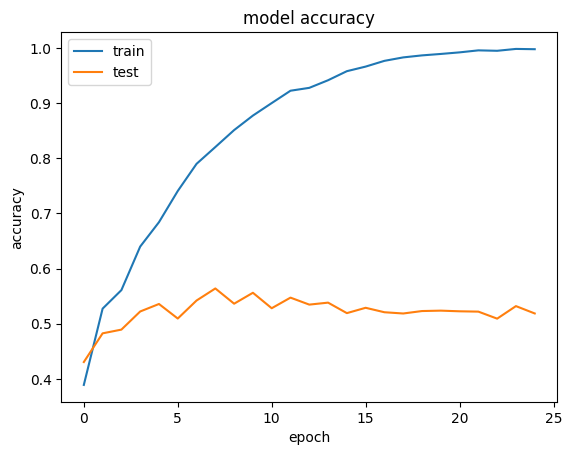

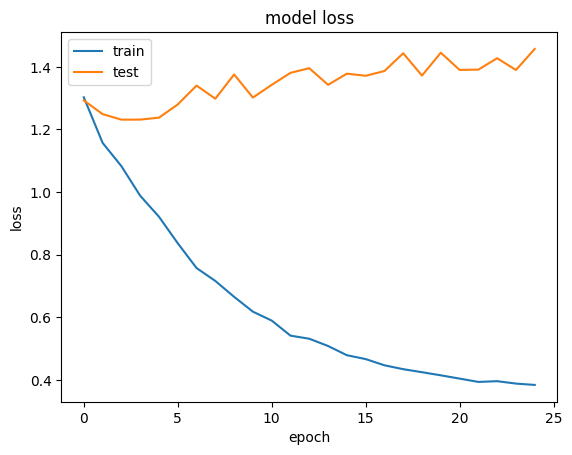

In [31]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Dense CNN

In [32]:
from tensorflow.python.ops.array_ops import zeros
from tensorflow.keras.layers import Dense

class DenseConvLayer(tf.keras.layers.Layer):
    def __init__(self, num_filters, regularizer_rate, dropout_rate, batch_norm, weight_ini):
        super(DenseConvLayer, self).__init__()
        # Initialization of variables
        self.dropout_rate = dropout_rate
        self.batch_norm = batch_norm


        # if regularizer is active
        if regularizer_rate:
            self.conv = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', activation='relu', kernel_regularizer=tf.keras.regularizers.L2(regularizer_rate))
        # if dropout is active
        if dropout_rate:
            self.conv = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', activation='relu')
            self.dropout_layer = tf.keras.layers.Dropout(dropout_rate)
        # if batch normalization is active
        if batch_norm:
            self.conv = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', activation='relu')
            self.batch_norm_layer = tf.keras.layers.BatchNormalization()
        if weight_ini:
            self.conv = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', activation='relu', kernel_initializer=tf.keras.initializers.HeUniform())
        else: 
            self.conv = tf.keras.layers.Conv2D(filters=num_filters, kernel_size=3, padding='same', activation='relu')
            

    def call(self, x, training=False):
        # forward step
        y = self.conv(x)
        if self.dropout_rate:
            y = self.dropout_layer(y, training=training)
        if self.batch_norm:
            y = self.batch_norm_layer(y, training=training)
        # concatenate input (x) with output (c) on the last axis (depth-axis) as new output
        x = tf.concat((x,y), axis=-1)
        return x

class DenseConvBlock(tf.keras.layers.Layer):
    def __init__(self, num_filters, CNNlayers, regularizer_rate, dropout_rate, batch_norm, weight_ini):
        super(DenseConvBlock, self).__init__()
        # run all layers and store output of block as a list in self.layers
        self.layer_list = [DenseConvLayer(num_filters, regularizer_rate, dropout_rate, batch_norm, weight_ini) for _ in range(CNNlayers)]

    def call(self, x, training=False):
        # iterate through all layers
        for layer in self.layer_list:
            x = layer(x, training)
        return x

class DenseCNN(tf.keras.Model):
    def __init__(self, regularizer_rate, dropout_rate, batch_norm, weight_ini):
        super(DenseCNN, self).__init__()
        # Blocks
        # img size: 32x32
        self.dense_block1 = DenseConvBlock(num_filters=32, CNNlayers=2, regularizer_rate=regularizer_rate, dropout_rate=dropout_rate, batch_norm=batch_norm, weight_ini=weight_ini)
        self.pooling1 = tf.keras.layers.MaxPooling2D(strides=2)
        # img size: 16x16
        self.dense_block2 = DenseConvBlock(num_filters=64, CNNlayers=4, regularizer_rate=regularizer_rate, dropout_rate=dropout_rate, batch_norm=batch_norm, weight_ini=weight_ini)
        self.pooling2 = tf.keras.layers.MaxPooling2D()
        # img size: 8x8
        self.dense_block3 = DenseConvBlock(num_filters=128, CNNlayers=8, regularizer_rate=regularizer_rate, dropout_rate=dropout_rate, batch_norm=batch_norm, weight_ini=weight_ini)
        self.globalpooling = tf.keras.layers.GlobalMaxPool2D()
        # img size: 1x1
        self.out = tf.keras.layers.Dense(4, activation='softmax')

        # Optimizer
        self.optimizer = tf.keras.optimizers.Adam()

        # Metrics
        self.metrics_list = [tf.keras.metrics.Mean(name="loss"),
                             tf.keras.metrics.CategoricalAccuracy(name="accuracy")]

        # Loss function
        self.loss_function = tf.keras.losses.CategoricalCrossentropy()

    def call(self, x, training=False):
        x = self.dense_block1(x, training)
        x = self.pooling1(x)
        x = self.dense_block2(x, training)
        x = self.pooling2(x)
        x = self.dense_block3(x, training)
        x = self.globalpooling(x)
        x = self.out(x)
        return x
    
    @property
    def metrics(self):
        return self.metrics_list
    
    def reset_metrics(self):
        for metric in self.metrics:
            metric.reset_states()
    
    def train_step(self, data):
        img, label = data

        with tf.GradientTape() as tape:
            output = self(img, training=True)
            loss = self.loss_function(label, output)

        gradients = tape.gradient(loss, self.trainable_variables)

        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

        # update loss metric
        self.metrics[0].update_state(loss)
        for metric in self.metrics[1:]:
            metric.update_state(label, output)
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        img, label = data
        
        output = self(img, training=False)
        loss = self.loss_function(label, output)

        # update loss metric
        self.metrics[0].update_state(loss)
        for metric in self.metrics[1:]:
            metric.update_state(label, output)
        return {m.name: m.result() for m in self.metrics}

In [33]:
# Define where to save the log
config_name= "Beatbox_CNN"
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

train_log_path = f"/content/drive/MyDrive/logs/{config_name}/{current_time}/train"
test_log_path = f"/content/drive/MyDrive/logs/{config_name}/{current_time}/test"

# log writer for training metrics
train_summary_writer = tf.summary.create_file_writer(train_log_path)

# log writer for validation metrics
test_summary_writer = tf.summary.create_file_writer(test_log_path)

In [34]:
def training_loop(model, train_ds, test_ds, epochs, train_summary_writer, test_summary_writer):
    for epoch in range(epochs):
        print(f"Epoch {epoch}:")

        # Training
        for data in tqdm.tqdm(train_ds, position=0, leave=True):
            metrics = model.train_step(data)
            

            with train_summary_writer.as_default():
                for metric in model.metrics:
                    tf.summary.scalar(f"{metric.name}", metric.result(), step=epoch)
        
        # print the metrics
        print([f"train_{key}: {value.numpy()}" for (key, value) in metrics.items()])

        # reset all metrics
        model.reset_metrics()

        # Validation
        for data in test_ds:
            metrics = model.test_step(data)

            # logging the validation metrics to the log file which is used by tensorboard
            with test_summary_writer.as_default():
                for metric in model.metrics:
                    tf.summary.scalar(f"{metric.name}", metric.result(), step=epoch)
        
        print([f"test_{key}: {value.numpy()}" for (key, value) in metrics.items()])

        # reset all metrics
        model.reset_metrics()
        print("\n")

In [35]:
# Run training loop
training_loop(model= DenseCNN(regularizer_rate=0.01, dropout_rate=0.2, batch_norm=True, weight_ini=True), 
              train_ds=train_dataset, 
              test_ds=test_dataset, 
              epochs=25, 
              train_summary_writer=train_summary_writer, 
              test_summary_writer=test_summary_writer)

Epoch 0:


100%|██████████| 120/120 [00:32<00:00,  3.67it/s]


['train_loss: 3.659365653991699', 'train_accuracy: 0.49687498807907104']
['test_loss: 2.3887085914611816', 'test_accuracy: 0.26358336210250854']


Epoch 1:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 2.393937587738037', 'train_accuracy: 0.5145833492279053']
['test_loss: 3.4725308418273926', 'test_accuracy: 0.235422745347023']


Epoch 2:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 1.5655744075775146', 'train_accuracy: 0.5903645753860474']
['test_loss: 3.8677005767822266', 'test_accuracy: 0.23257355391979218']


Epoch 3:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 1.293738842010498', 'train_accuracy: 0.6270833611488342']
['test_loss: 4.587935447692871', 'test_accuracy: 0.2437715381383896']


Epoch 4:


100%|██████████| 120/120 [00:16<00:00,  7.13it/s]


['train_loss: 1.1631442308425903', 'train_accuracy: 0.6723958253860474']
['test_loss: 2.6427206993103027', 'test_accuracy: 0.34680625796318054']


Epoch 5:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 1.128542423248291', 'train_accuracy: 0.68359375']
['test_loss: 2.4748334884643555', 'test_accuracy: 0.38218924403190613']


Epoch 6:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.8220685124397278', 'train_accuracy: 0.749218761920929']
['test_loss: 2.1363985538482666', 'test_accuracy: 0.42459580302238464']


Epoch 7:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.7467204928398132', 'train_accuracy: 0.7572916746139526']
['test_loss: 2.6776509284973145', 'test_accuracy: 0.3613172471523285']


Epoch 8:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.8531156778335571', 'train_accuracy: 0.7442708611488342']
['test_loss: 3.3396105766296387', 'test_accuracy: 0.3422342836856842']


Epoch 9:


100%|██████████| 120/120 [00:16<00:00,  7.21it/s]


['train_loss: 0.9493831396102905', 'train_accuracy: 0.749218761920929']
['test_loss: 4.252555847167969', 'test_accuracy: 0.3006228506565094']


Epoch 10:


100%|██████████| 120/120 [00:16<00:00,  7.32it/s]


['train_loss: 0.6994755268096924', 'train_accuracy: 0.79296875']
['test_loss: 3.4779255390167236', 'test_accuracy: 0.3259342610836029']


Epoch 11:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.5112313628196716', 'train_accuracy: 0.8377603888511658']
['test_loss: 4.135965824127197', 'test_accuracy: 0.2971773147583008']


Epoch 12:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.5012437701225281', 'train_accuracy: 0.8419271111488342']
['test_loss: 2.8496856689453125', 'test_accuracy: 0.39928439259529114']


Epoch 13:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.6450684070587158', 'train_accuracy: 0.8091145753860474']
['test_loss: 3.6372833251953125', 'test_accuracy: 0.36111846566200256']


Epoch 14:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.7955619692802429', 'train_accuracy: 0.7934895753860474']
['test_loss: 4.612401962280273', 'test_accuracy: 0.31003180146217346']


Epoch 15:


100%|██████████| 120/120 [00:16<00:00,  7.08it/s]


['train_loss: 0.7425416111946106', 'train_accuracy: 0.7986978888511658']
['test_loss: 4.506175994873047', 'test_accuracy: 0.32805460691452026']


Epoch 16:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.4066292941570282', 'train_accuracy: 0.8614583611488342']
['test_loss: 3.3599815368652344', 'test_accuracy: 0.35257089138031006']


Epoch 17:


100%|██████████| 120/120 [00:16<00:00,  7.28it/s]


['train_loss: 0.5595179200172424', 'train_accuracy: 0.8450520634651184']
['test_loss: 4.090825080871582', 'test_accuracy: 0.3392525911331177']


Epoch 18:


100%|██████████| 120/120 [00:16<00:00,  7.37it/s]


['train_loss: 0.5352339148521423', 'train_accuracy: 0.8500000238418579']
['test_loss: 3.3545784950256348', 'test_accuracy: 0.42784255743026733']


Epoch 19:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.5684712529182434', 'train_accuracy: 0.8565104007720947']
['test_loss: 3.949550151824951', 'test_accuracy: 0.4473230838775635']


Epoch 20:


100%|██████████| 120/120 [00:16<00:00,  7.36it/s]


['train_loss: 0.4810712933540344', 'train_accuracy: 0.8729166388511658']
['test_loss: 3.2862796783447266', 'test_accuracy: 0.37755101919174194']


Epoch 21:


100%|██████████| 120/120 [00:17<00:00,  6.99it/s]


['train_loss: 0.44061145186424255', 'train_accuracy: 0.8705729246139526']
['test_loss: 2.969316244125366', 'test_accuracy: 0.4181685745716095']


Epoch 22:


100%|██████████| 120/120 [00:16<00:00,  7.30it/s]


['train_loss: 0.3925476372241974', 'train_accuracy: 0.8890625238418579']
['test_loss: 7.991254806518555', 'test_accuracy: 0.2551020383834839']


Epoch 23:


100%|██████████| 120/120 [00:16<00:00,  7.27it/s]


['train_loss: 0.31104424595832825', 'train_accuracy: 0.9104166626930237']
['test_loss: 4.850066184997559', 'test_accuracy: 0.43161940574645996']


Epoch 24:


100%|██████████| 120/120 [00:20<00:00,  5.86it/s]


['train_loss: 0.29101303219795227', 'train_accuracy: 0.9117187261581421']
['test_loss: 3.4312193393707275', 'test_accuracy: 0.38437584042549133']




In [37]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/logs/Beatbox_CNN

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 21803), started 0:00:37 ago. (Use '!kill 21803' to kill it.)

<IPython.core.display.Javascript object>